In [1]:
# Import Libraries
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from pycocotools.coco import COCO
from pycocotools import mask as maskUtils
import cv2
import os

In [2]:
# Define directories
image_directory = '../data/depth-anything-v2-set2/images/'  # Original Images
mask_directory = '../data/depth-anything-v2-set2/masks/'    # Saved masks
csv_file = "../data/csv/depth-anything-v2-updated-with-annotations.csv"  # CSV file

# Load the JSON file
coco = COCO('../data/depth-anything-v2-set2/annotations/instances_default.json')  # .json file

os.makedirs(mask_directory, exist_ok=True)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [3]:
# Load the CSV file
data = pd.read_csv(csv_file)
data.head()

,dataset,video_name,image_name,mask_name,frame,image_id,annotation_id,category_id,marker_id,size_m,...,Unnamed: 12,focal_length,path_to_file,Lx0,Ly0,Lx1,Ly1,coord_id,segmentation,bbox
0,20240307-indoor,gp9-27_GX010042,gp9-27_GX010042_frame_0001.jpg,mask_gp9-27_GX010042_frame_0001_21.png,1,31,NaN,NaN,0,0.100,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN
1,20240307-indoor,gp9-27_GX010042,gp9-27_GX010042_frame_0001.jpg,mask_gp9-27_GX010042_frame_0001_21.png,1,31,NaN,NaN,2,0.150,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN
2,20240307-indoor,gp9-27_GX010042,gp9-27_GX010042_frame_0001.jpg,mask_gp9-27_GX010042_frame_0001_21.png,1,31,NaN,NaN,3,0.127,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN
3,20240307-indoor,gp9-27_GX010043,gp9-27_GX010043_frame_0010.jpg,mask_gp9-27_GX010043_frame_0010_22.png,10,32,NaN,NaN,1,0.070,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN
4,20240307-indoor,gp9-27_GX010043,gp9-27_GX010043_frame_0010.jpg,mask_gp9-27_GX010043_frame_0010_22.png,10,32,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,NaN,NaN


In [4]:
# Ensure 'image_name' and 'coord_id' columns are present
if 'image_name' not in data.columns or 'coord_id' not in data.columns:
    raise ValueError("CSV file must contain 'image_name' and 'coord_id' columns.")

# Group the CSV data by 'image_name'
csv_grouped = data.groupby('image_name')

# Get all image ids
image_ids = coco.getImgIds()

In [5]:
# Function to create a color mask
def apply_color_mask(mask, color):
    """
    Apply the given color to the mask.
    Parameters:
    mask : 2D numpy array
        Binary mask with 0s and 1s.
    color : tuple
        RGB tuple (e.g., (255, 0, 0) for red).

    Returns:
    3D numpy array
        Colored mask.
    """
    color_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
    for i in range(3):  # Apply color to each channel
        color_mask[:, :, i] = mask * color[i]
    return color_mask

/tmp/ipykernel_72046/1869555871.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('hsv', num_anns + 1)


Img Name: 101_exp92_L_22213.jpg


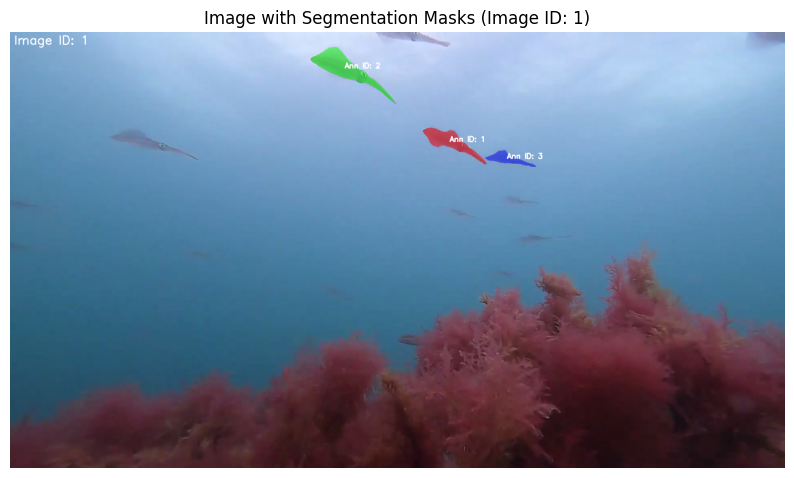

/tmp/ipykernel_72046/1869555871.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('hsv', num_anns + 1)


Img Name: 105_exp96_L_11815.jpg


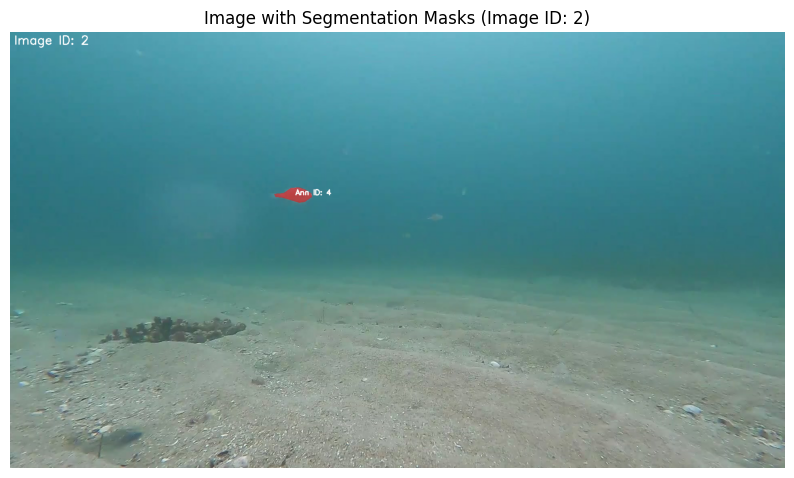

Img Name: 116_exp92_L_2546.jpg


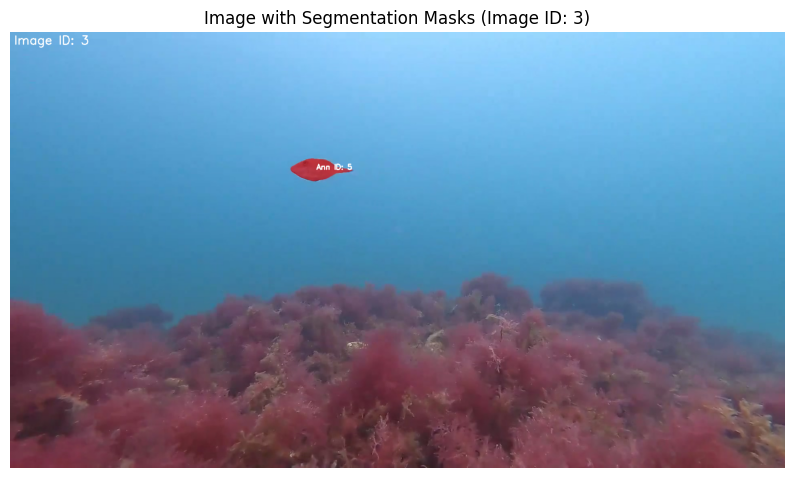

Img Name: 11_exp83_L_1646.jpg


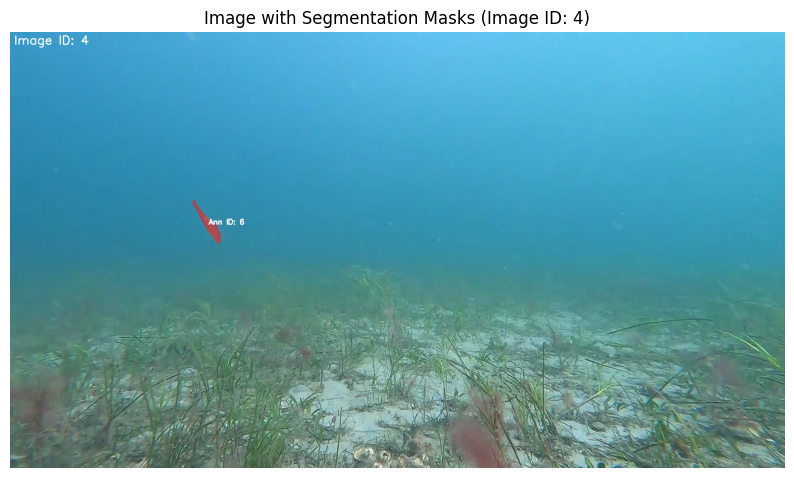

Img Name: 130_exp96_L_15036.jpg


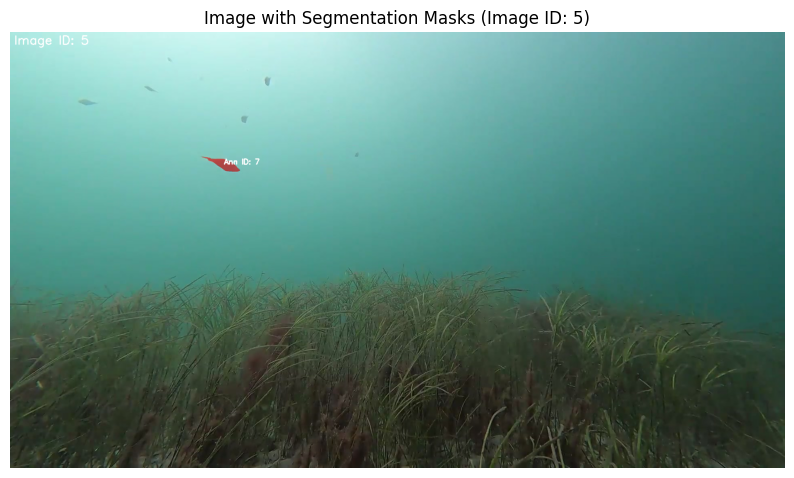

Img Name: 1_exp83_L_3542.jpg


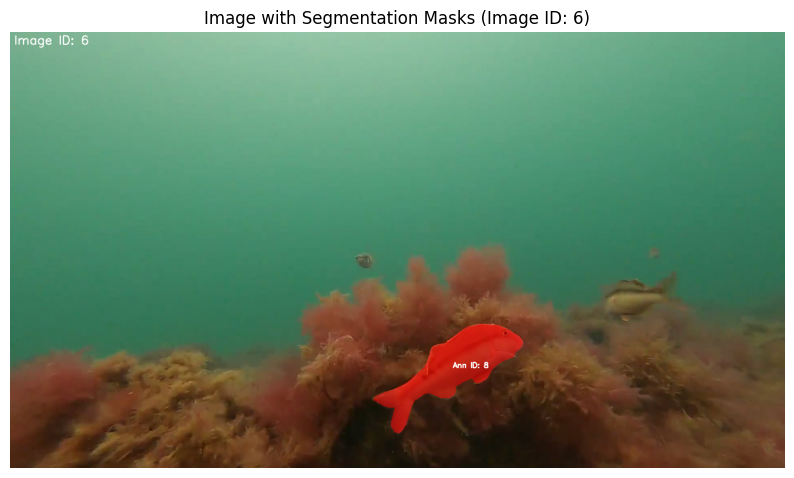

Img Name: 1_exp83_L_3600.jpg


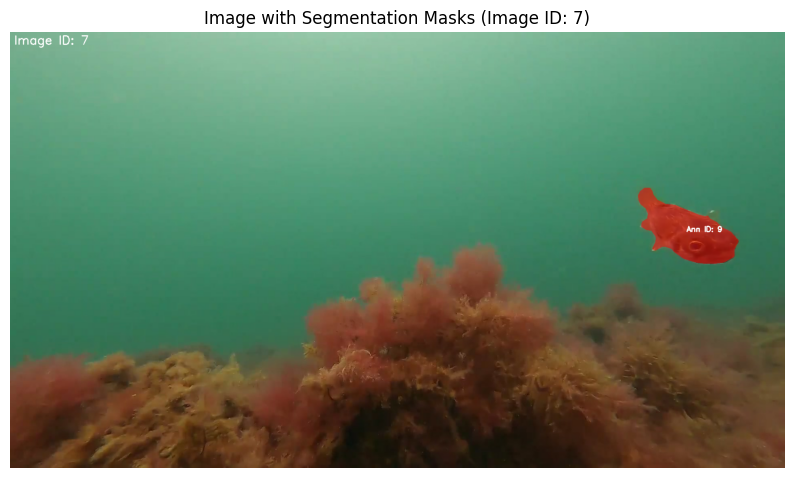

Img Name: 21_exp92_L_8951.jpg


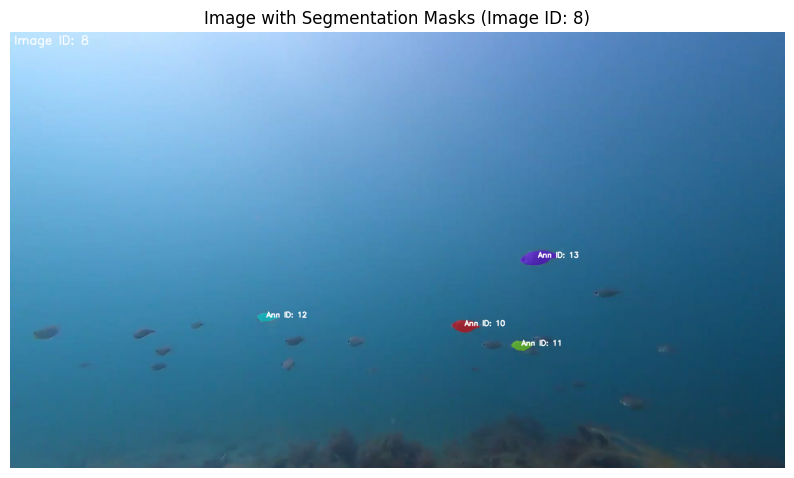

Img Name: 2_exp92_L_24756.jpg


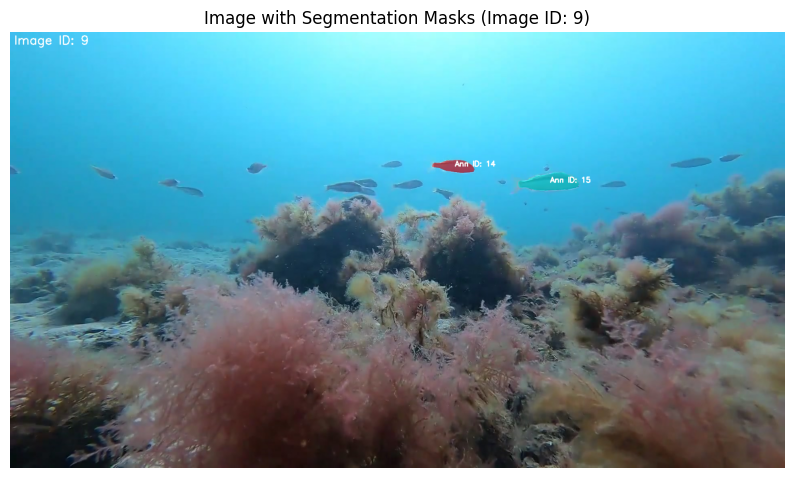

Img Name: 3001_exp107_L_14622.jpg


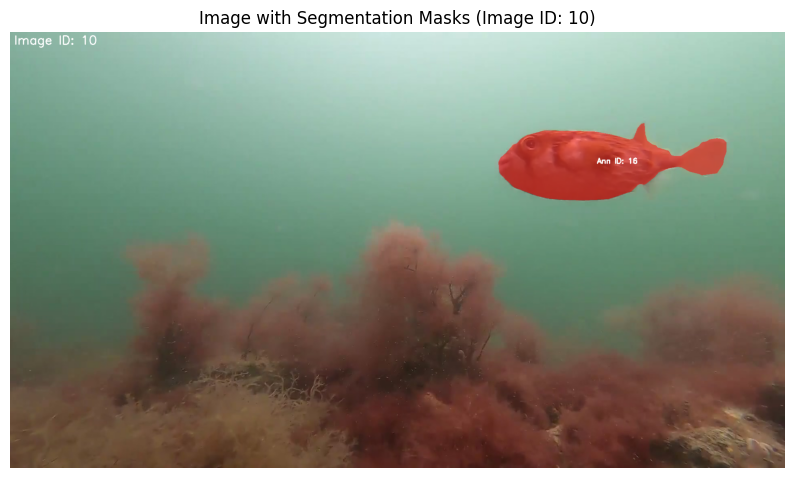

Img Name: 3012_exp96_L_12885.jpg


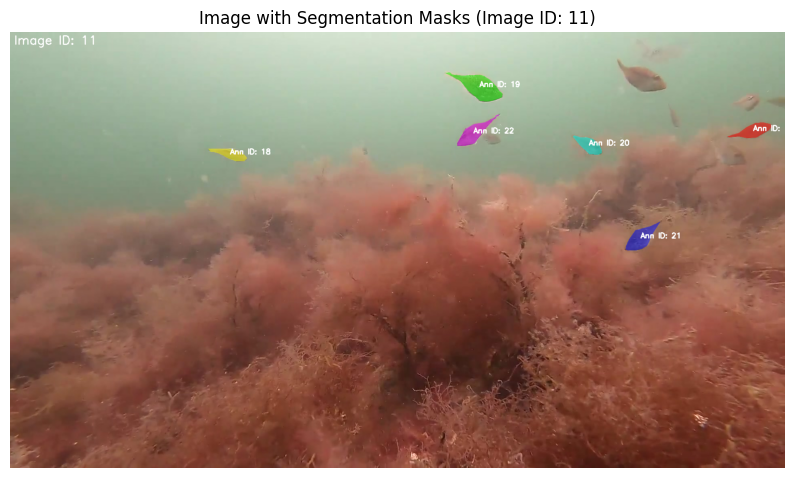

Img Name: 3017_exp96_L_7365.jpg


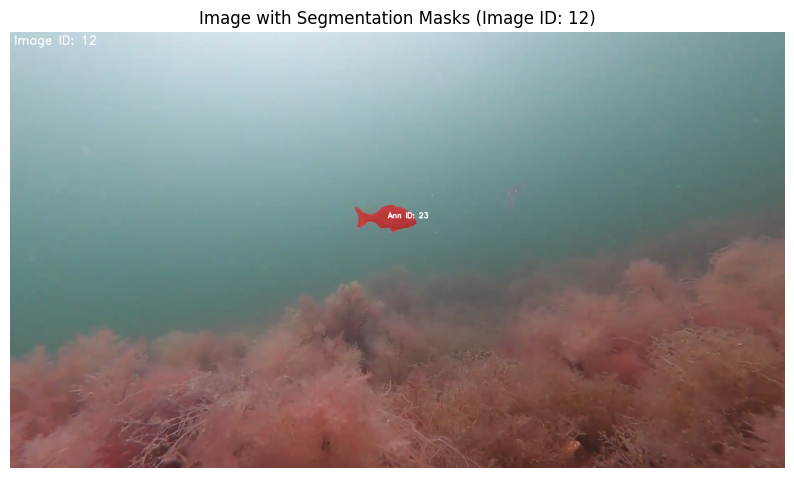

Img Name: 3040_exp83_L_19869.jpg


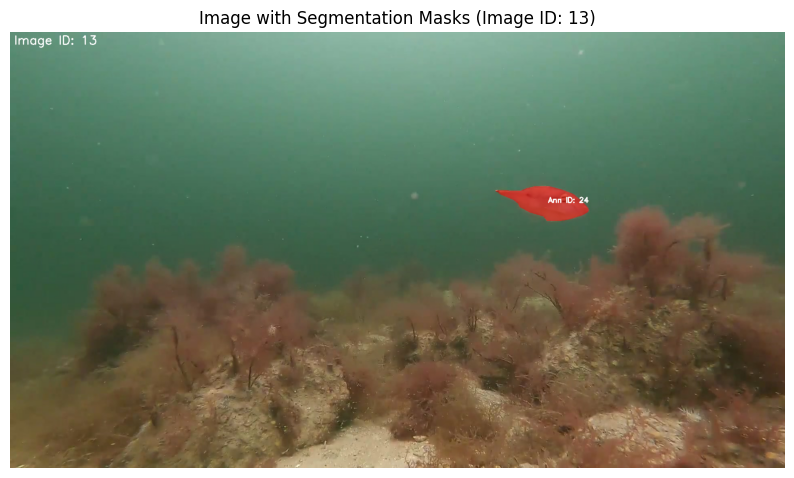

Img Name: 3042_exp95_L_16608.jpg


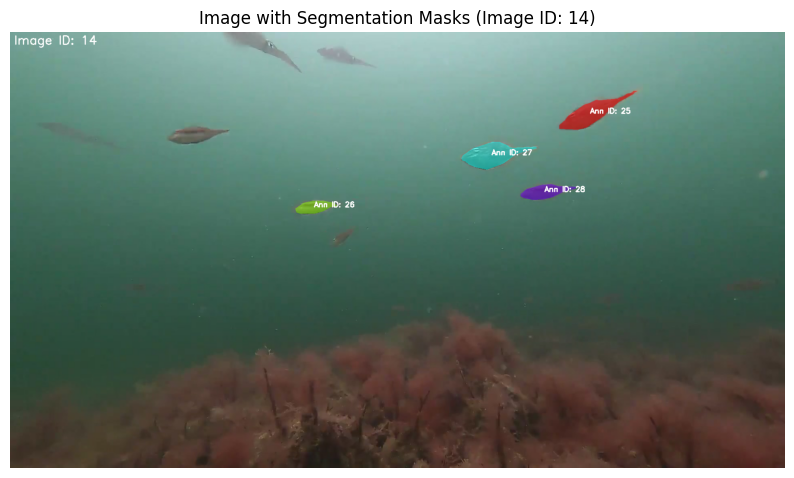

Img Name: 3063_exp104_L_4482.jpg


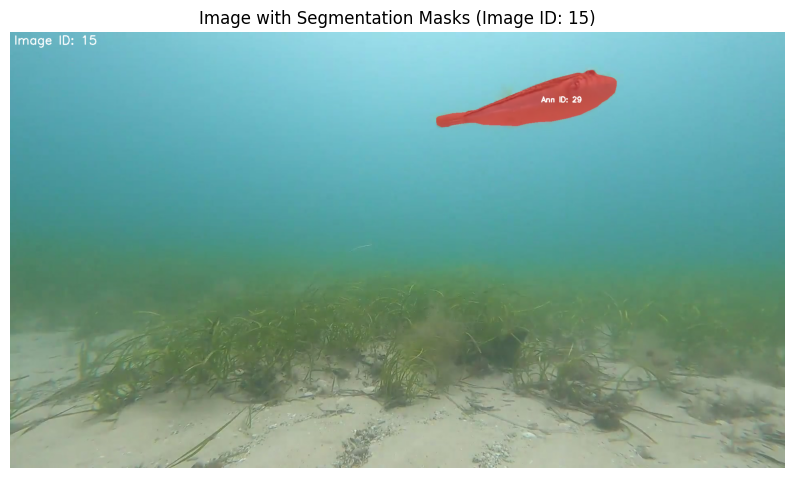

Img Name: 4022_exp96_L_18169.jpg


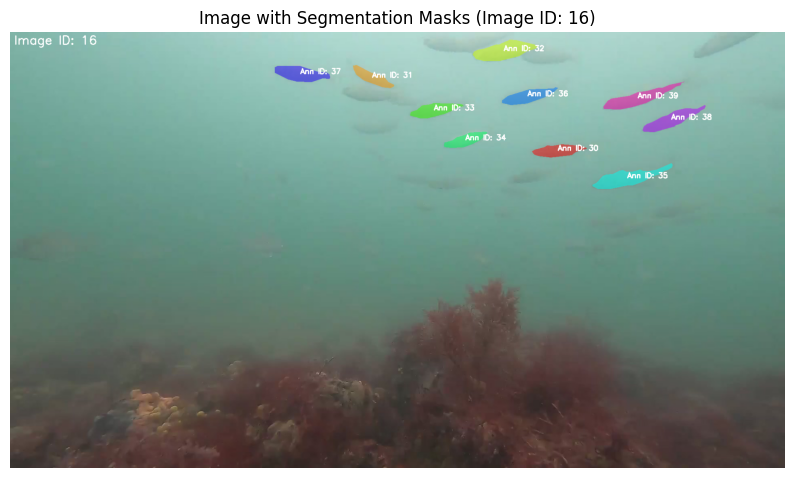

Img Name: 4022_exp96_L_18187.jpg


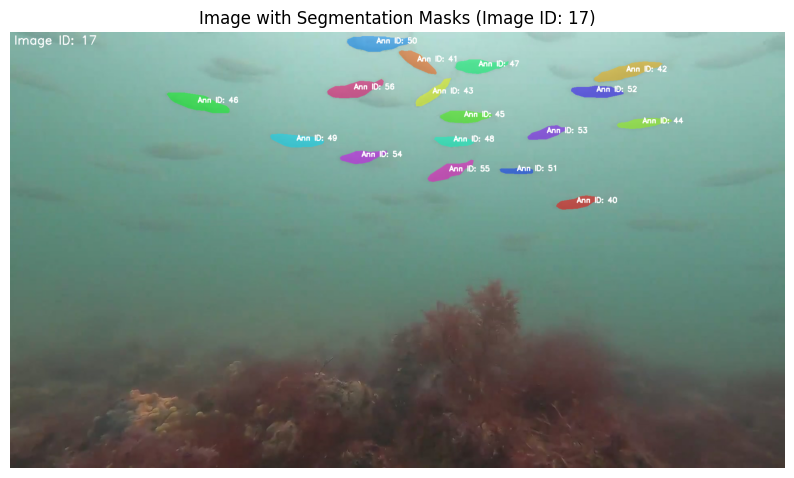

Img Name: 4023_exp95_L_4051.jpg


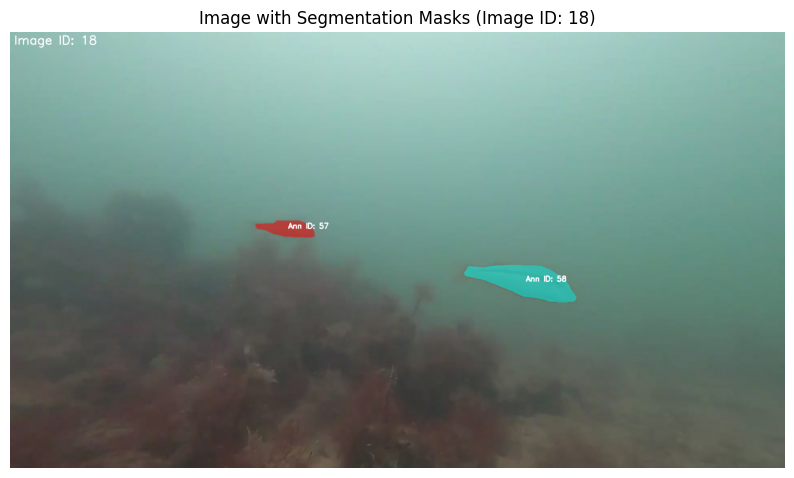

Img Name: 4028_exp104_L_21124.jpg


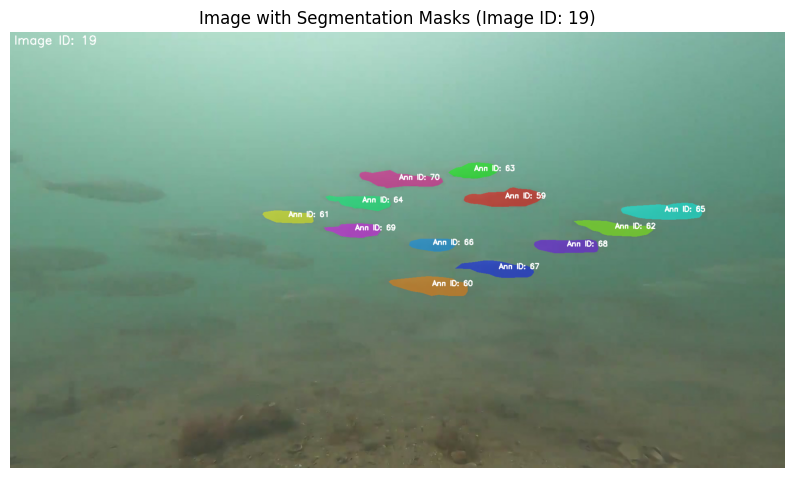

Img Name: 4056_exp104_L_18121.jpg


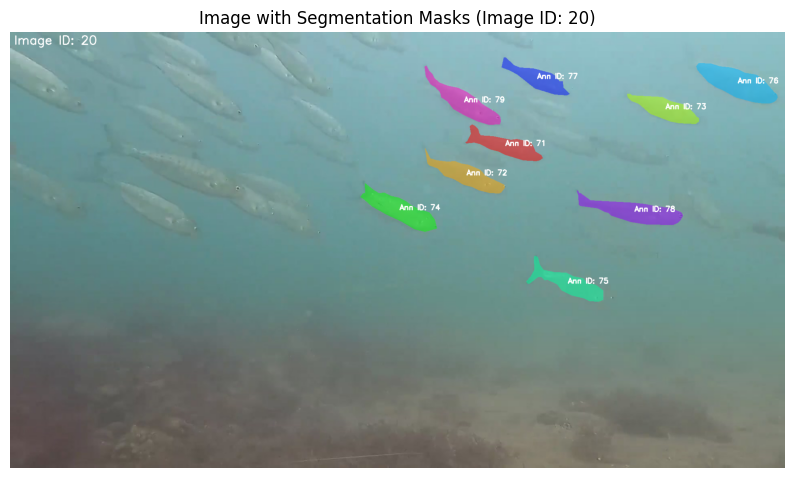

Img Name: 4073_exp83_L_19710.jpg


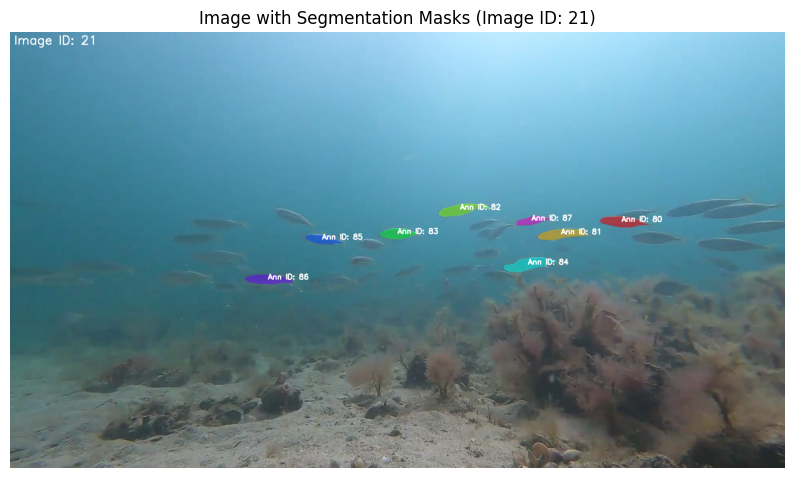

Img Name: 4074_exp96_L_18711.jpg


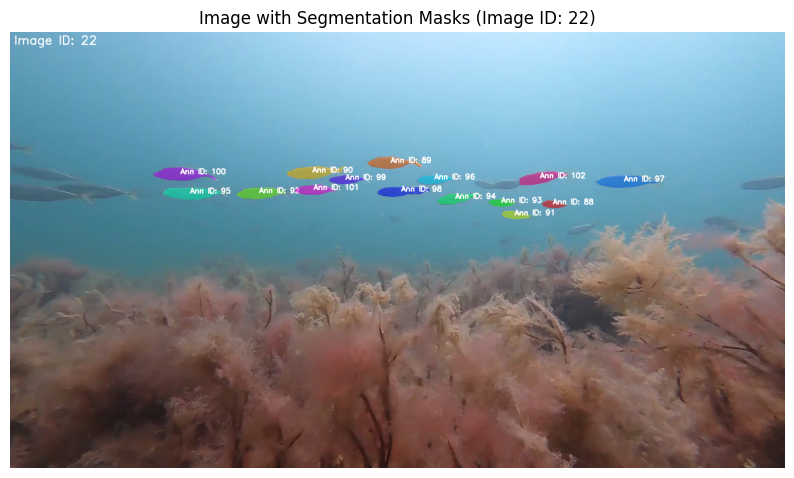

Img Name: 4081_exp97_L_21298.jpg


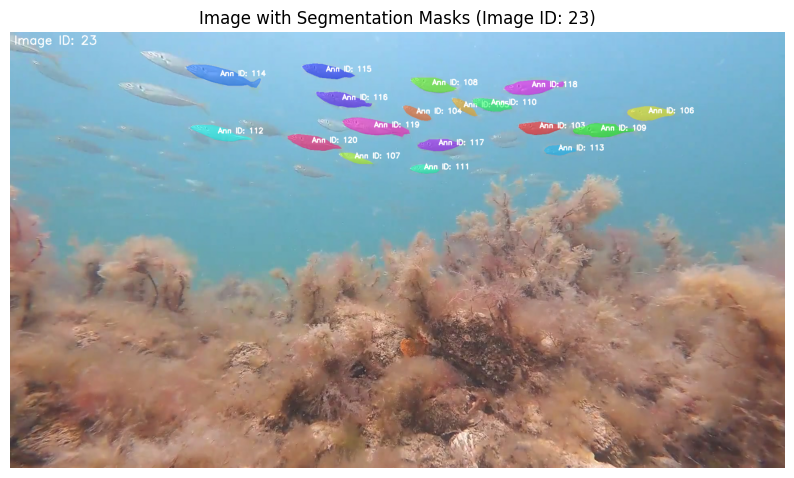

Img Name: 4085_exp95_L_9287.jpg


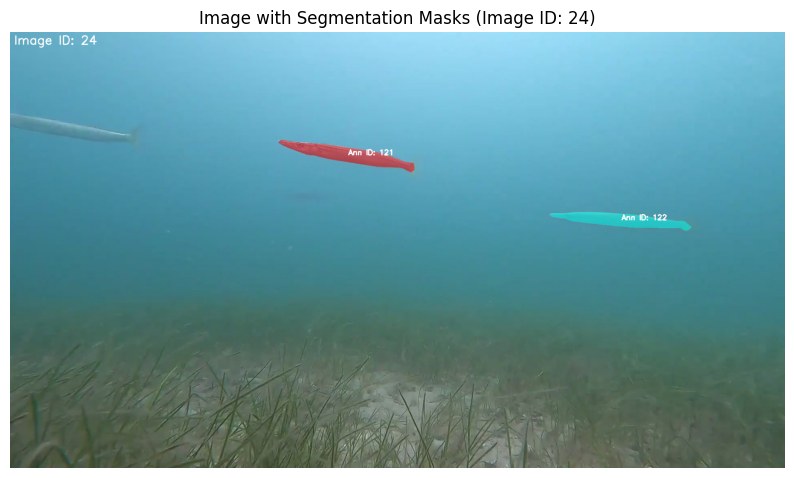

Img Name: 42_exp94_L_1947.jpg


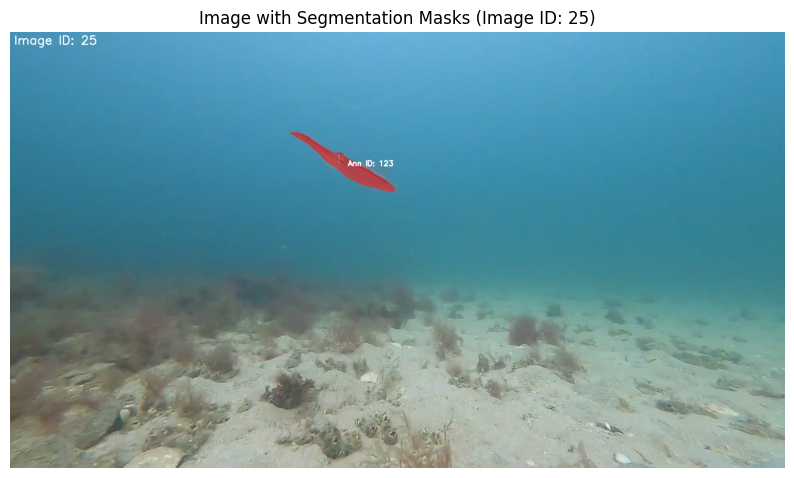

Img Name: 43_exp96_L_17856.jpg


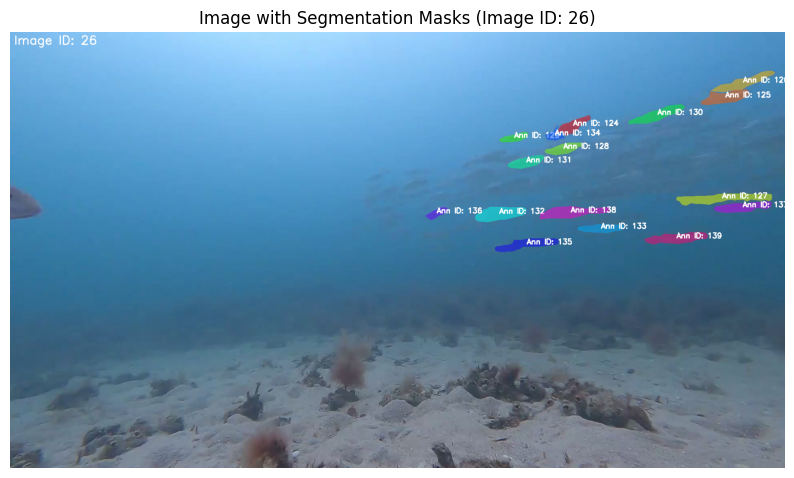

Img Name: 43_exp96_L_18580.jpg


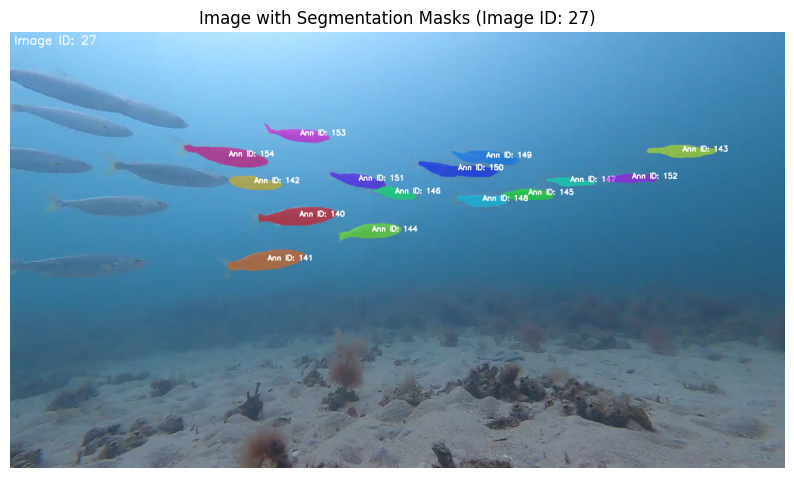

Img Name: 44_exp92_L_1656.jpg


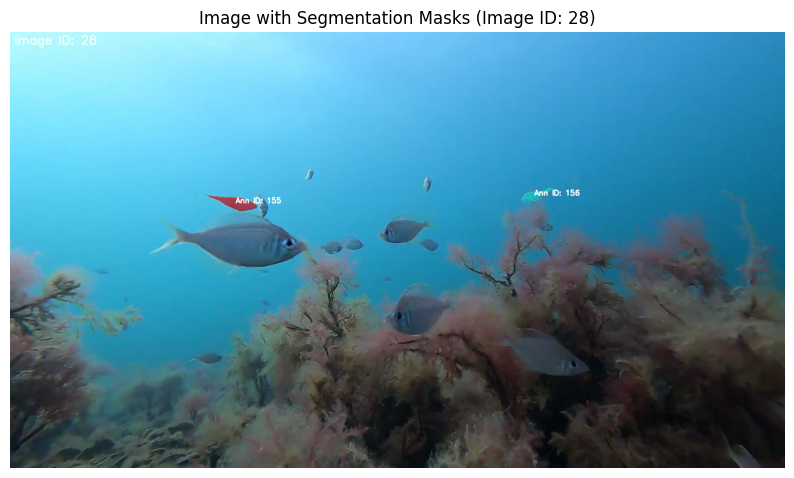

Img Name: 45_exp97_L_12950.jpg


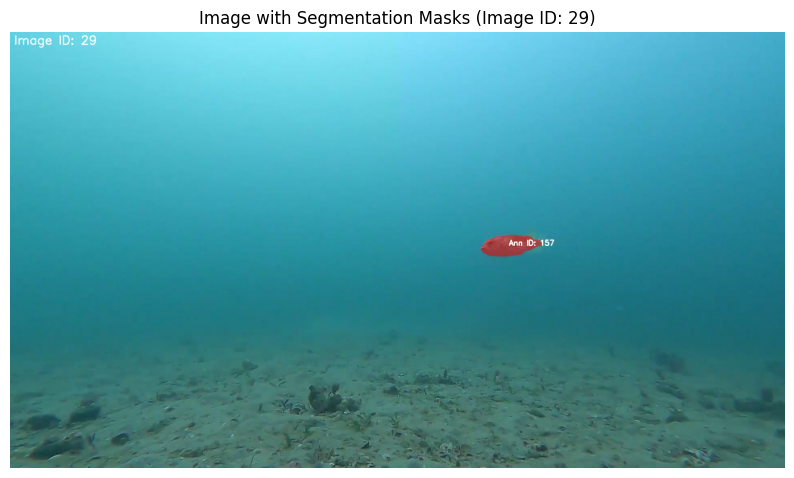

Img Name: 523_exp104_L_21065.jpg


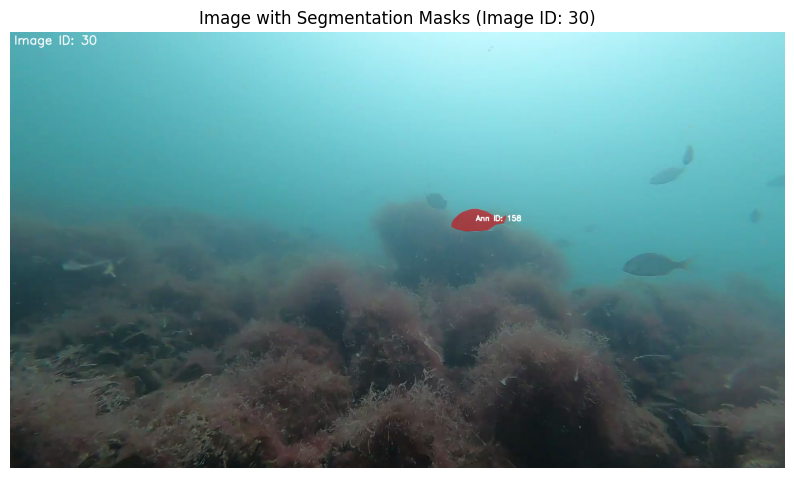

Img Name: gp9-27_GX010042_frame_0001.jpg


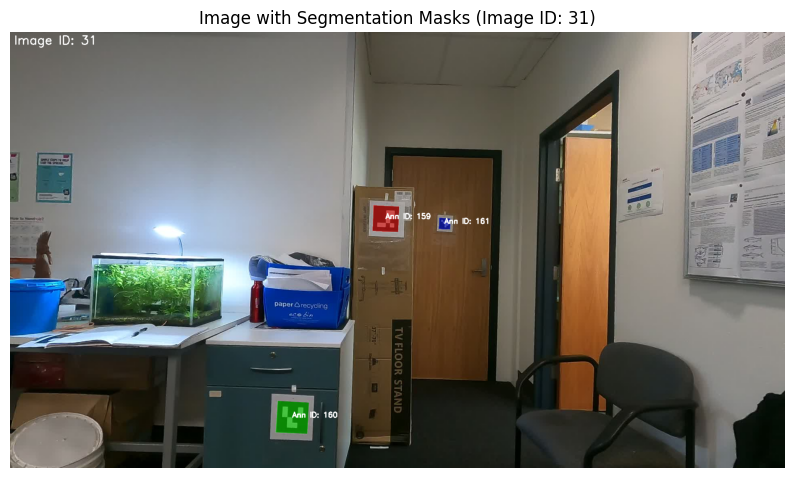

Img Name: gp9-27_GX010043_frame_0010.jpg


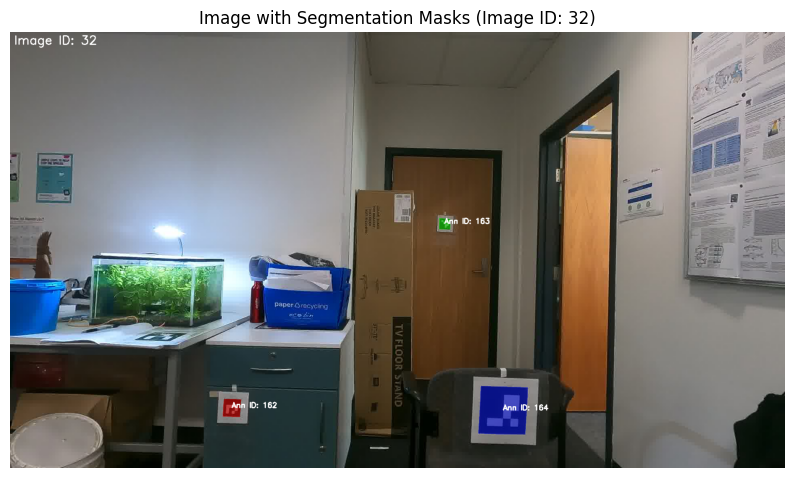

Img Name: gp9-27_GX010047_frame_0001.jpg


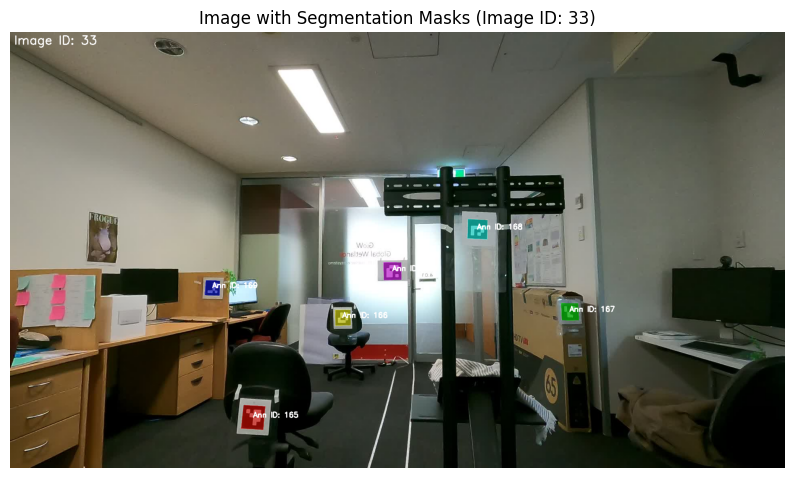

Img Name: gp9-27_GX010049_frame_0001.jpg


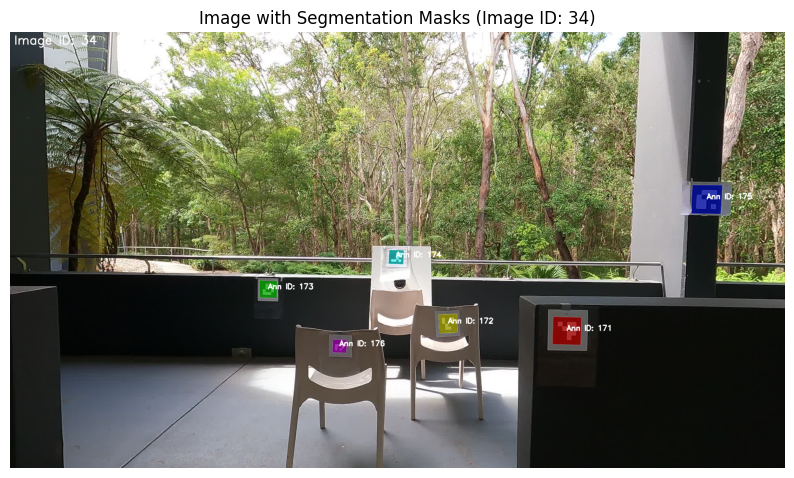

Img Name: mono_03_1_19086.png


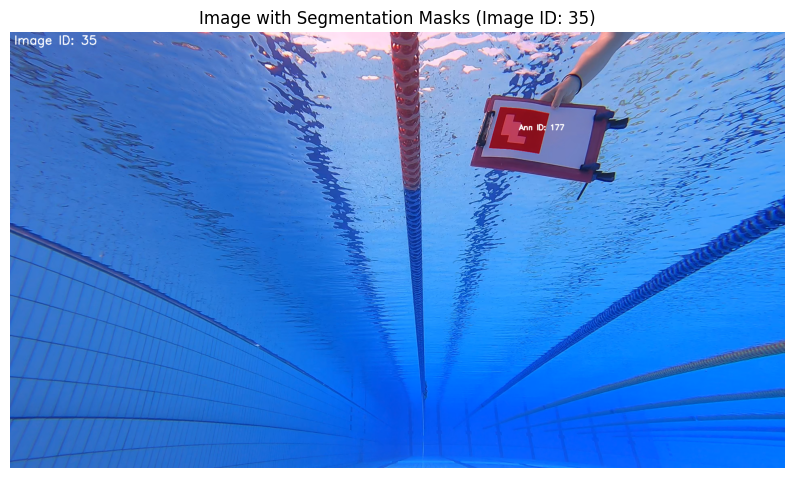

Img Name: mono_03_7_2500.png


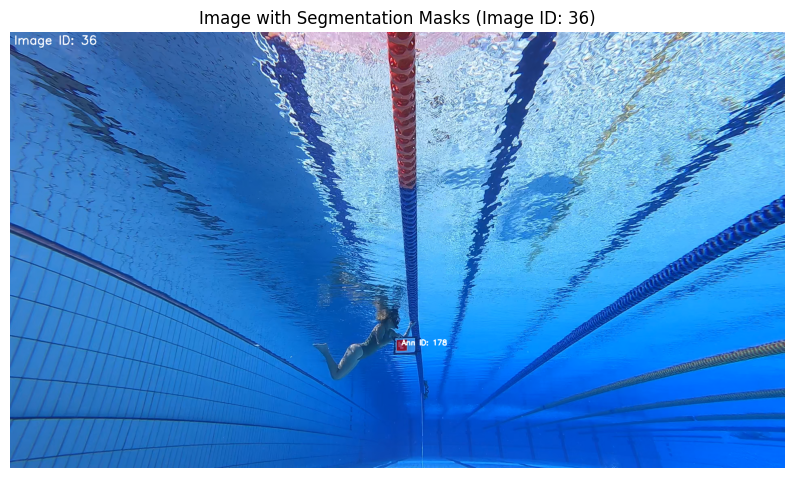

Img Name: mono_04_10_8780.png


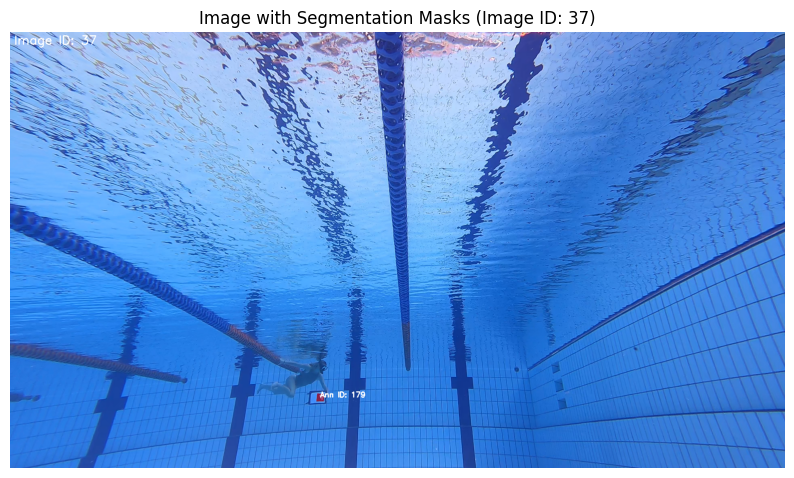

Img Name: mono_04_1_6507.png


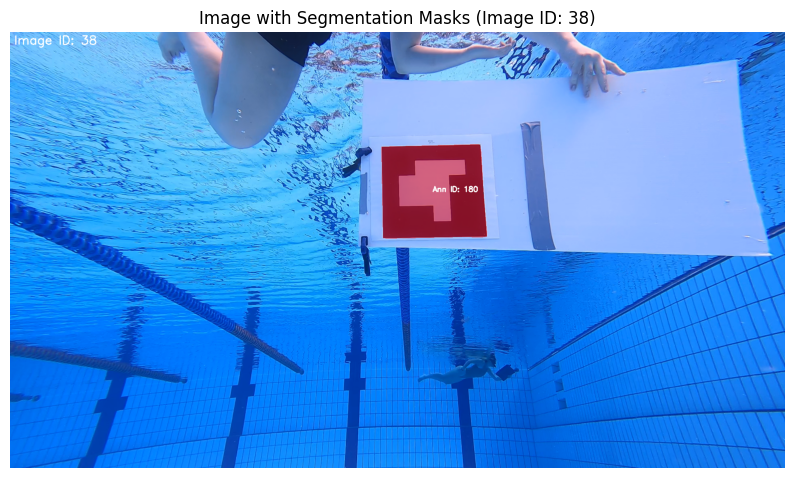

Img Name: mono_04_2_10900.png


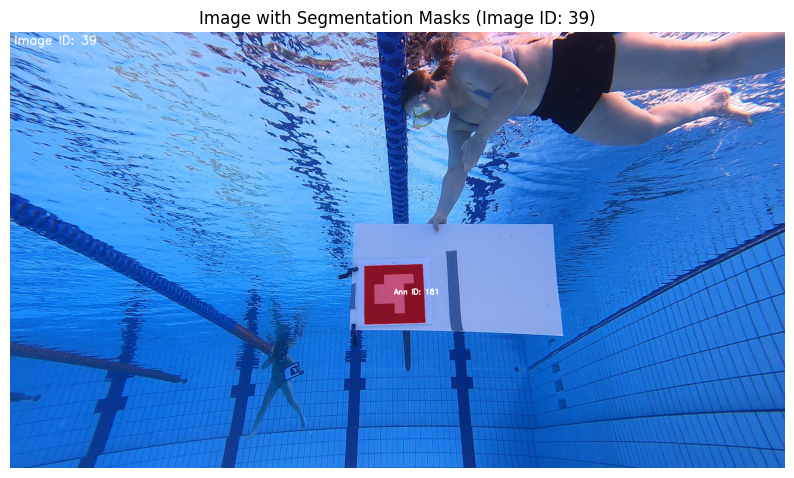

Img Name: mono_04_7_20150.png


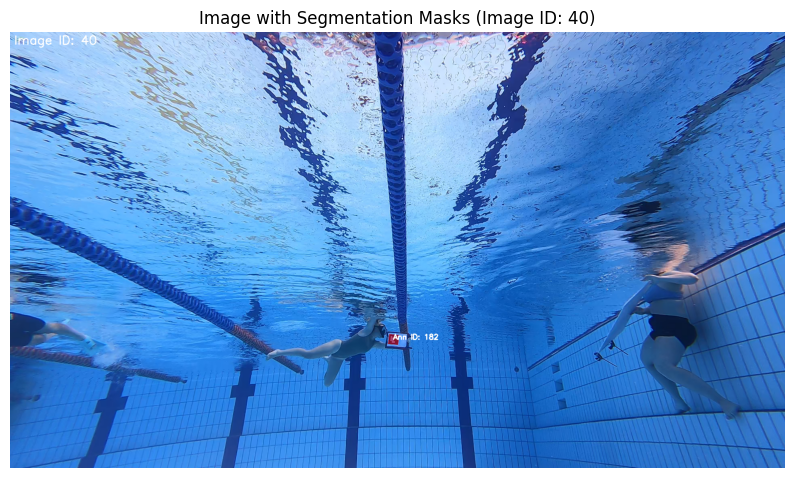

In [6]:
# Loop over each image
for img_id in image_ids:
    # Get image info
    img_info = coco.loadImgs(img_id)[0]
    img_name = img_info['file_name']  # Keep extension

    # Load the image
    img_path = os.path.join(image_directory, img_name)
    if not os.path.exists(img_path):
        print(f"Image {img_path} not found.")
        continue
    img = np.array(Image.open(img_path).convert('RGB'))

    # Create copies of the image for different plots
    img_with_masks = img.copy()
    img_with_points = img.copy()

    # Get annotations for this image
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)

    # Prepare a color palette for annotations
    np.random.seed(42)  # For reproducible colors
    num_anns = len(anns)
    colors = plt.cm.get_cmap('hsv', num_anns + 1)

    # Overlay each annotation mask with its annotation id
    for idx, ann in enumerate(anns):
        # Extract the mask for this annotation
        segmentation = ann['segmentation']
        if isinstance(segmentation, list):  # Polygon format
            mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)
            # Convert polygons to a mask
            for poly in segmentation:
                poly = np.array(poly).reshape((-1, 2))
                cv2.fillPoly(mask, [np.int32(poly)], 1)
        elif isinstance(segmentation, dict) and 'counts' in segmentation:  # RLE format
            rle = segmentation
            if isinstance(rle['counts'], list):
                rle = maskUtils.frPyObjects([rle], img_info['height'], img_info['width'])
            mask = maskUtils.decode(rle)
        else:
            continue  # Skip if segmentation format is not recognized

        # Ensure mask is binary
        mask = mask.astype(bool)

        # Create a colored mask
        color = (np.array(colors(idx))[:3] * 255).astype(np.uint8)
        colored_mask = apply_color_mask(mask.astype(np.uint8), color)

        # Overlay the mask on the image
        alpha = 0.5  # Transparency factor
        idxs = mask > 0
        img_with_masks[idxs] = img_with_masks[idxs] * (1 - alpha) + colored_mask[idxs] * alpha

        # Get the centroid of the mask to place the annotation id
        ys, xs = np.where(mask)
        if ys.size > 0 and xs.size > 0:
            centroid_x = int(np.mean(xs))
            centroid_y = int(np.mean(ys))
            # Put annotation id text
            cv2.putText(img_with_masks, f'Ann ID: {ann["id"]}', (centroid_x, centroid_y),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)

    # Overlay image id on the image
    cv2.putText(img_with_masks, f'Image ID: {img_id}', (10, 30),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

    # Get CSV data for this image
    if img_name in csv_grouped.groups:
        csv_rows = csv_grouped.get_group(img_name)
    else:
        print(f"No CSV data for image {img_name}")
        csv_rows = None

    # Display the image with masks and annotation ids
    plt.figure(figsize=(10, 10))
    plt.imshow(img_with_masks.astype(np.uint8))
    print(f'Img Name: {img_name}')
    plt.title(f'Image with Segmentation Masks (Image ID: {img_id})')
    plt.axis('off')
    plt.show()